# AlexNet

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision.datasets import Imagenette
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid, save_image
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import numpy as np
import os
import re

In [2]:
os.makedirs("models", exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 512
IMAGE_SIZE = 256
NUM_EPOCHS = 30

In [3]:
class Lighting(object):
    """AlexNet-style PCA-based lighting noise (Krizhevsky et al., 2012)."""
    def __init__(self, alphastd: float, eigvals: torch.Tensor, eigvecs: torch.Tensor):
        self.alphastd = float(alphastd)
        self.eigvals = eigvals.float()
        self.eigvecs = eigvecs.float()

    def __call__(self, x: torch.Tensor) -> torch.Tensor:
        if self.alphastd <= 0:
            return x
        alpha = torch.normal(0.0, self.alphastd, size=(3,), dtype=x.dtype, device=x.device)
        rgb = self.eigvecs @ (self.eigvals.sqrt() * alpha)
        x = x + rgb.view(3, 1, 1)
        return x.clamp(0.0, 1.0)


class RandomCropWithMeanSub:
    def __init__(self, size: int, mean_image: torch.Tensor):
        self.size = size
        self.mean_image = mean_image

    def __call__(self, x: torch.Tensor) -> torch.Tensor:
        i, j, h, w = transforms.RandomCrop.get_params(TF.to_pil_image(x), output_size=(self.size, self.size))
        x = TF.crop(x, i, j, h, w)
        m = TF.crop(self.mean_image, i, j, h, w)
        return x - m


class CenterCropWithMeanSub:
    def __init__(self, size: int, mean_image: torch.Tensor):
        self.size = size
        self.mean_image = mean_image

    def __call__(self, x: torch.Tensor) -> torch.Tensor:
        H, W = x.shape[-2], x.shape[-1]
        i = (H - self.size) // 2
        j = (W - self.size) // 2
        x_c = x[:, i:i+self.size, j:j+self.size]
        m_c = self.mean_image[:, i:i+self.size, j:j+self.size]
        return x_c - m_c

In [32]:
pca_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float32),
])

train_dataset_for_pca = Imagenette(
    root=".", split="train", download=False, transform=pca_transform
)
pca_loader = DataLoader(train_dataset_for_pca, batch_size=64, shuffle=False)

mean_image = torch.stack([img for img, _ in train_dataset_for_pca]).mean(dim=0).float().cpu()
torch.save(mean_image, "mean_train_image.pth")

sum_rgb = torch.zeros(3)
sum_rgb2 = torch.zeros(3, 3)
num_pixels = 0

for imgs, _ in pca_loader:
    B, C, H, W = imgs.shape
    pixels = imgs.permute(0, 2, 3, 1).reshape(-1, 3)
    sum_rgb += pixels.sum(dim=0)
    num_pixels += pixels.shape[0]

mu = sum_rgb / num_pixels

for imgs, _ in pca_loader:
    pixels = imgs.permute(0, 2, 3, 1).reshape(-1, 3)
    centered = pixels - mu
    sum_rgb2 += centered.t() @ centered

cov = sum_rgb2 / num_pixels

eigvals, eigvecs = torch.linalg.eigh(cov)
eigvals = eigvals.flip(0)
eigvecs = eigvecs.flip(1)

mu = mu.float().cpu()
eigvals = eigvals.float().cpu()
eigvecs = eigvecs.float().cpu()    
torch.save({"mu": mu, "eigvals": eigvals, "eigvecs": eigvecs}, "pca_stats.pth")

In [4]:
stats = torch.load("imagenette_files/pca_stats.pth")
mu, eigvals, eigvecs = stats["mu"], stats["eigvals"], stats["eigvecs"]
mean_image = torch.load("imagenette_files/mean_train_image.pth").float().cpu()


transform_train = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float32),
    Lighting(0.1, eigvals, eigvecs),
    RandomCropWithMeanSub(224, mean_image),
    transforms.RandomHorizontalFlip(),
])


transform_val = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float32),
    CenterCropWithMeanSub(224, mean_image),
])


train_dataset = Imagenette(root=".", split='train', download=False, transform=transform_train)
test_dataset = Imagenette(root=".", split='val', download=False, transform=transform_val)


NUM_WORKERS = 8
PREFETCH    = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=True,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=False,
)

In [ ]:
class AlexNet(nn.Module):

    def __init__(self, num_classes: int = 10):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 96, kernel_size=11, stride=4, padding=2)
        self.relu1 = nn.ReLU()
        self.lrn1 = nn.LocalResponseNorm(size=5, alpha=5*1e-4, beta=0.75, k=2)
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2)

        self.conv2 = nn.Conv2d(96, 256, kernel_size=5, stride=1, padding=2)
        self.conv2._bias_one = True
        self.relu2 = nn.ReLU()
        self.lrn2 = nn.LocalResponseNorm(size=5, alpha=5*1e-4, beta=0.75, k=2)
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=2)

        self.conv3 = nn.Conv2d(256, 384, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.ReLU()
        self.conv4 = nn.Conv2d(384, 384, kernel_size=3, stride=1, padding=1)
        self.conv4._bias_one = True
        self.relu4 = nn.ReLU()
        self.conv5 = nn.Conv2d(384, 256, kernel_size=3, stride=1, padding=1)
        self.conv5._bias_one = True
        self.relu5 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=2)

        self.lin1 = nn.Linear(256*6*6, 4096)
        self.lin1._bias_one  = True
        self.relu6 = nn.ReLU()
        self.drop1 = nn.Dropout(p=0.5, inplace=False)

        self.lin2 = nn.Linear(4096, 4096)
        self.lin2._bias_one  = True
        self.relu7 = nn.ReLU()
        self.drop2 = nn.Dropout(p=0.5, inplace=False)

        self.lin3 = nn.Linear(4096, num_classes)
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        B = x.shape[0]

        x = self.conv1(x)
        x = self.relu1(x)
        x = self.lrn1(x)
        x = self.pool1(x)

        x = self.conv2(x)
        x = self.relu2(x)
        x = self.lrn2(x)
        x = self.pool2(x)

        x = self.conv3(x)
        x = self.relu3(x)

        x = self.conv4(x)
        x = self.relu4(x)

        x = self.conv5(x)
        x = self.relu5(x)
        x = self.pool3(x)

        x = torch.flatten(x, 1)
        
        x = self.lin1(x)
        x = self.relu6(x)
        x = self.drop1(x)

        x = self.lin2(x)
        x = self.relu7(x)
        x = self.drop2(x)

        x = self.lin3(x)
        return x

In [6]:
def init_weights(m: nn.Module) -> None:
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0.)

In [ ]:
def evaluate(model, loader: DataLoader, device: str, loss_fn: callable) -> tuple[float, float, float]:
    model.eval()
    total_loss = 0.0
    total = 0
    top1_correct = 0
    top5_correct = 0

    with torch.no_grad():
        val_bar = tqdm(loader, desc="[Eval]", leave=False)
        for imgs, labels in val_bar:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            outputs = model(imgs)
            loss = loss_fn(outputs, labels)
            total_loss += loss.item()

            maxk = min(5, outputs.size(1))
            _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)
            pred = pred.t()
            correct = pred.eq(labels.view(1, -1).expand_as(pred))

            top1_correct += correct[:1].sum().item()
            top5_correct += correct[:maxk].sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(loader)
    top1_acc = 100.0 * top1_correct / total
    top5_acc = 100.0 * top5_correct / total
    return avg_loss, top1_acc, top5_acc


In [8]:
model = AlexNet()
model.to(device)
model.apply(init_weights)

optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.1, patience=1,
)
loss_fn = nn.CrossEntropyLoss()

In [9]:
for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]", leave=False)
    for imgs, labels in train_bar:
        imgs = imgs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)


        optimizer.zero_grad(set_to_none=True)
        outputs = model(imgs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    
    avg_val_loss, top1_acc, top5_acc = evaluate(model, test_loader, device, loss_fn)
    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch+1} - Train loss: {avg_train_loss:.4f} | "
          f"Val loss: {avg_val_loss:.4f} | Top-1 val acc: {top1_acc:.2f}% | Top-5 val acc: {top5_acc:.2f}%" )

    if (epoch + 1) % 10 == 0:
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "train_loss": avg_train_loss,
            "val_loss": avg_val_loss,
            "top1_val_acc": top1_acc,
            "top5_val_acc": top5_acc,
        }, os.path.join("models", "alexnet_imagenette_checkpoint.pth"))


Epoch 1 - Train loss: 2.7824 | Val loss: 2.2647 | Top-1 val acc: 15.77% | Top-5 val acc: 62.52%


Epoch 2 - Train loss: 2.1001 | Val loss: 1.9544 | Top-1 val acc: 30.19% | Top-5 val acc: 75.46%


Epoch 3 - Train loss: 1.9729 | Val loss: 1.9098 | Top-1 val acc: 30.98% | Top-5 val acc: 78.37%


Epoch 4 - Train loss: 1.8348 | Val loss: 1.7752 | Top-1 val acc: 36.59% | Top-5 val acc: 82.90%


Epoch 5 - Train loss: 1.7223 | Val loss: 1.6228 | Top-1 val acc: 44.10% | Top-5 val acc: 85.94%


Epoch 6 - Train loss: 1.6133 | Val loss: 1.4902 | Top-1 val acc: 48.87% | Top-5 val acc: 88.03%


Epoch 7 - Train loss: 1.4681 | Val loss: 1.4273 | Top-1 val acc: 51.01% | Top-5 val acc: 89.96%


Epoch 8 - Train loss: 1.3896 | Val loss: 1.2923 | Top-1 val acc: 55.62% | Top-5 val acc: 91.18%


Epoch 9 - Train loss: 1.2822 | Val loss: 1.2813 | Top-1 val acc: 56.79% | Top-5 val acc: 91.41%


Epoch 10 - Train loss: 1.2047 | Val loss: 1.1771 | Top-1 val acc: 60.56% | Top-5 val acc: 92.92%


Epoch 11 - Train loss: 1.1343 | Val loss: 1.1114 | Top-1 val acc: 63.29% | Top-5 val acc: 93.17%


Epoch 12 - Train loss: 1.0524 | Val loss: 1.0710 | Top-1 val acc: 65.68% | Top-5 val acc: 93.78%


Epoch 13 - Train loss: 1.0008 | Val loss: 1.0188 | Top-1 val acc: 67.36% | Top-5 val acc: 94.39%


Epoch 14 - Train loss: 0.9397 | Val loss: 0.9805 | Top-1 val acc: 67.82% | Top-5 val acc: 95.31%


Epoch 15 - Train loss: 0.8649 | Val loss: 0.9760 | Top-1 val acc: 67.64% | Top-5 val acc: 95.08%


Epoch 16 - Train loss: 0.8068 | Val loss: 0.9135 | Top-1 val acc: 70.39% | Top-5 val acc: 95.90%


Epoch 17 - Train loss: 0.7635 | Val loss: 0.9647 | Top-1 val acc: 69.15% | Top-5 val acc: 94.93%


Epoch 18 - Train loss: 0.7513 | Val loss: 0.8670 | Top-1 val acc: 72.33% | Top-5 val acc: 96.20%


Epoch 19 - Train loss: 0.6877 | Val loss: 0.8540 | Top-1 val acc: 72.41% | Top-5 val acc: 96.08%


Epoch 20 - Train loss: 0.6532 | Val loss: 0.8672 | Top-1 val acc: 73.02% | Top-5 val acc: 96.15%


Epoch 21 - Train loss: 0.6573 | Val loss: 0.8392 | Top-1 val acc: 73.04% | Top-5 val acc: 96.18%


Epoch 22 - Train loss: 0.6166 | Val loss: 0.8710 | Top-1 val acc: 73.15% | Top-5 val acc: 95.95%


Epoch 23 - Train loss: 0.5816 | Val loss: 0.8118 | Top-1 val acc: 74.60% | Top-5 val acc: 96.54%


Epoch 24 - Train loss: 0.5272 | Val loss: 0.8494 | Top-1 val acc: 74.78% | Top-5 val acc: 96.48%


Epoch 25 - Train loss: 0.4924 | Val loss: 0.8365 | Top-1 val acc: 74.57% | Top-5 val acc: 96.66%


Epoch 26 - Train loss: 0.4096 | Val loss: 0.7983 | Top-1 val acc: 76.66% | Top-5 val acc: 96.97%


Epoch 27 - Train loss: 0.3668 | Val loss: 0.8011 | Top-1 val acc: 77.04% | Top-5 val acc: 97.12%


Epoch 28 - Train loss: 0.3418 | Val loss: 0.8052 | Top-1 val acc: 76.99% | Top-5 val acc: 97.10%


Epoch 29 - Train loss: 0.3426 | Val loss: 0.8075 | Top-1 val acc: 77.25% | Top-5 val acc: 97.22%


Epoch 30 - Train loss: 0.3294 | Val loss: 0.8086 | Top-1 val acc: 77.12% | Top-5 val acc: 97.12%


# Visualising AlexNet

In [10]:
checkpoint = torch.load("models/alexnet_imagenette_checkpoint.pth", map_location="cpu")
model = AlexNet().to(device)
model.load_state_dict(checkpoint["model_state_dict"], strict=False)
model.eval()

AlexNet(
  (conv1): Conv2d(3, 96, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (relu1): ReLU()
  (lrn1): LocalResponseNorm(5, alpha=0.0005, beta=0.75, k=2)
  (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu2): ReLU()
  (lrn2): LocalResponseNorm(5, alpha=0.0005, beta=0.75, k=2)
  (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu4): ReLU()
  (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu5): ReLU()
  (pool3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (lin1): Linear(in_features=9216, out_features=4096, bias=True)
  (relu6): ReLU()
  (drop1): Dropout(p=0.5, inplace=False)
  (l

In [ ]:
class GuidedBackprop:

    def __init__(self, model: nn.Module):
        self.model = model
        self._handles = []
        def fwd_relu(m: nn.Module, inp: tuple[torch.Tensor, ...], out: torch.Tensor) -> None: 
            m._gbp_out = out

        def bwd_relu(m: nn.Module, gin: tuple[torch.Tensor, ...], gout: tuple[torch.Tensor, ...]) -> tuple[torch.Tensor,]:
            mask = (m._gbp_out > 0).type_as(gout[0])
            return (torch.clamp(gout[0], min=0.0) * mask, )

        for m in self.model.modules():
            if isinstance(m, nn.ReLU):
                self._handles.append(m.register_forward_hook(fwd_relu))
                self._handles.append(m.register_full_backward_hook(bwd_relu))


    def close(self) -> None:
        for h in self._handles: h.remove()
        self._handles.clear()


def compute_rf(model: nn.Module, in_hw: tuple[int, int] = (224,224),
               layers: tuple[str, ...] =('conv1','pool1','conv2','pool2','conv3','conv4','conv5','pool3')
               ) -> dict[str, tuple[int, int, float]]:
    """
    Return per-layer (rf_size, jump, start) in input pixel coords.
    start is the center (in pixel coords) of the [0,0] activation.
    """
    r, j, s = 1.0, 1.0, 0.5
    table = {}
    for name in layers:
        m = getattr(model, name)
        if isinstance(m, nn.Conv2d):
            k = float(m.kernel_size[0]); p = float(m.padding[0]); st = float(m.stride[0])
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        elif isinstance(m, nn.MaxPool2d):
            k = float(m.kernel_size if isinstance(m.kernel_size, int) else m.kernel_size[0])
            p = float(m.padding if isinstance(m.padding, int) else m.padding[0])
            st = float(m.stride if isinstance(m.stride, int) else m.stride[0])
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        table[name] = (int(round(r)), int(round(j)), float(s))

    return table

In [ ]:
class Visualiser:
    """
    Guided ReLU visualisation with top-k activations per feature map,
    receptive-field matched patches, and (optional) Grad-CAM overlays on patches.
    """
    TAP = {
        "conv1": "relu1",
        "pool1": "pool1",
        "conv2": "relu2",
        "pool2": "pool2",
        "conv3": "relu3",
        "conv4": "relu4",
        "conv5": "relu5",
        "pool3": "pool3",
    }

    def __init__(self, model: nn.Module, device: str = device, mean_image_224: torch.Tensor | None = None):
        self.m = model.eval().to(device)
        self.device = device
        self.handles = []
        self.acts = {}
        self._keep_graph = False
        self.mean_224 = mean_image_224.detach().cpu() if mean_image_224 is not None else None
        for name in ["conv1","pool1","conv2","pool2","conv3","conv4","conv5","pool3"]:
            self._register_activation(name)

        self.rf_tbl = compute_rf(self.m, in_hw=(224,224),
                                layers=["conv1","pool1","conv2","pool2","conv3","conv4","conv5","pool3"])


    def _register_activation(self, name: str) -> None:
        tap_name = self.TAP[name]
        mod = getattr(self.m, tap_name)
        def hook(_, __, out):
            self.acts[name] = out if self._keep_graph else out.detach()

        self.handles.append(mod.register_forward_hook(hook))


    @torch.no_grad()
    def _rank_channels_by_activity(self, loader: DataLoader, layer: str) -> list[int]:
        totals = None
        for imgs, _ in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            m = A.mean(dim=(0,2,3))
            totals = m if totals is None else totals + m

        return torch.argsort(totals, descending=True).tolist()


    def close(self) -> None:
        for h in self.handles: h.remove()
        self.handles.clear()


    @torch.no_grad()
    def _forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.m(x)


    def _forward_with_grad(self, x: torch.Tensor) -> torch.Tensor:
        self._keep_graph = True
        out = self.m(x)
        self._keep_graph = False

        return out


    def _guided_from_unit(self, layer: str, fmap: int, y: int, x: int, img1x: torch.Tensor) -> torch.Tensor:
        """
        Guided backprop map in input space for the scalar self.acts[layer][0,c,y,x]
        img1x: [1,3,224,224] requires_grad=True
        """
        gbp = GuidedBackprop(self.m)
        _ = self._forward_with_grad(img1x)
        scalar = self.acts[layer][0, fmap, y, x]
        self.m.zero_grad(set_to_none=True)
        scalar.backward(retain_graph=False)
        grad = img1x.grad.detach()[0]
        gbp.close()
        g = grad - grad.min()
        g = (g / (g.max() + 1e-8)).clamp(0,1)

        return g
    

    @staticmethod
    def _rf_box(rf: int, jump: int, start: float, y: int, x: int) -> tuple[int, int, int, int]:
        """Desired (exclusive) RF square in input coords for fmap (y,x)."""
        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf // 2
        y0, y1 = cy - half, cy + half + 1
        x0, x1 = cx - half, cx + half + 1

        return y0, y1, x0, x1


    @staticmethod
    def _rf_fully_inside(H: int, W: int, rf: int, jump: int, start: float, y: int, x: int) -> bool:
        """True iff the desired RF square lies entirely inside [0,H]×[0,W]."""
        y0, y1, x0, x1 = Visualiser._rf_box(rf, jump, start, y, x)

        return (y0 >= 0) and (x0 >= 0) and (y1 <= H) and (x1 <= W)


    @torch.inference_mode()
    def topk_for_featuremap(self, loader: DataLoader, layer: str, fmap: int, k: int = 9,
                            inside_only: bool = False, oversample_factor: int = 5
                            ) -> list[tuple[float, tuple[torch.Tensor, int, int], tuple[int, int]]]:
        """
        Collect global top-k activations for a given (layer, fmap). If inside_only=True,
        only keep units whose receptive-field square is fully inside the input image.
        oversample_factor>1 oversamples per-image candidates to survive the geometry filter.
        """
        top = []
        rf, jump, start = self.rf_tbl[layer]

        for imgs, labels in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            Hf, Wf = A.shape[-2:]
            Himg, Wimg = imgs.shape[-2:]

            n_cand = min(Hf * Wf, max(k, 1) * max(oversample_factor, 1))
            vals, idxs = A[:, fmap].view(imgs.size(0), -1).topk(n_cand, dim=1)

            for b in range(imgs.size(0)):
                for j in range(vals.shape[1]):
                    score = float(vals[b, j])

                    if score <= 0:
                        continue

                    flat = int(idxs[b, j])
                    y, x = divmod(flat, Wf)

                    if inside_only:
                        if not self._rf_fully_inside(Himg, Wimg, rf, jump, start, y, x):
                            continue

                    top.append((score,
                                (imgs[b].detach().cpu(), int(labels[b]), len(top)),
                                (y, x)))

        top = sorted(top, key=lambda t: t[0], reverse=True)[:k]

        return top


    @staticmethod
    def _crop_patch(img3hw: torch.Tensor, center_yx: tuple[int, int], rf_size: int, jump: int, start: float) -> torch.Tensor:
        """
        Map (y,x) in feature map → input crop of size rf_size×rf_size.
        Robust: computes the desired box, intersects with image, and pads
        exactly the missing pixels per side so the final tile is square and
        always rf_size×rf_size, avoiding 51 vs 52 mismatches.
        """
        H, W = img3hw.shape[-2], img3hw.shape[-1]
        y, x = center_yx

        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf_size // 2

        y0_des, y1_des = cy - half, cy + half + 1
        x0_des, x1_des = cx - half, cx + half + 1

        y0, y1 = max(0, y0_des), min(H, y1_des)
        x0, x1 = max(0, x0_des), min(W, x1_des)
        patch = img3hw[:, y0:y1, x0:x1]

        pad_top    = max(0, -y0_des)
        pad_bottom = max(0,  y1_des - H)
        pad_left   = max(0, -x0_des)
        pad_right  = max(0,  x1_des - W)
        if pad_left or pad_right or pad_top or pad_bottom:
            patch = F.pad(patch, (pad_left, pad_right, pad_top, pad_bottom))

        if patch.shape[-2:] != (rf_size, rf_size):
            patch = F.pad(
                patch,
                (0, max(0, rf_size - patch.shape[-1]),
                0, max(0, rf_size - patch.shape[-2]))
            )[:, :rf_size, :rf_size]

        return patch


    def figure2_panel(    
        self,
        loader: DataLoader,
        layers: str | tuple[str, ...] = ("conv1","conv2","conv3","conv4","conv5"),
        k_per_map: int = 9,
        n_maps: int = 4,
        seed: int = 0
    ) -> dict[str, list[tuple[torch.Tensor, torch.Tensor]]]:

        if isinstance(layers, str):
            layers = (layers,)

        rng = np.random.default_rng(seed)
        self.m.eval()
        panels = {}

        for layer in layers:
            C = getattr(self.m, layer).out_channels if layer.startswith("conv") else self.acts[layer].shape[1]
            ranked = self._rank_channels_by_activity(loader, layer)
            chosen = np.array(ranked[:min(n_maps, C)])
            rows = []
            rf, jump, start = self.rf_tbl[layer]
            guided_rows = {}

            for fmap in chosen:
                items = self.topk_for_featuremap(
                    loader, layer, fmap, k=k_per_map, inside_only=True, oversample_factor=5
                )

                guided_imgs, patch_imgs = [], []

                for score, (img, lbl, _), (y, x) in items:
                    x_full = img.to(self.device, non_blocking=True).clone().unsqueeze(0)
                    patch_raw = self._crop_patch(img.cpu(), (y, x), rf, jump, start)
                    img1x = x_full.clone().requires_grad_(True)
                    gmap = self._guided_from_unit(layer, fmap, y, x, img1x).cpu()
                    gpatch = self._crop_patch(gmap, (y, x), rf, jump, start).clamp(0,1)

                    if self.mean_224 is not None:
                        mean_patch = self._crop_patch(self.mean_224, (y, x), rf, jump, start)
                        patch_disp = (patch_raw + mean_patch).clamp(0, 1)
                    else:
                        patch_disp = patch_raw if (patch_raw.min() >= 0 and patch_raw.max() <= 1) else patch_raw.clamp(0, 1)

                    guided_imgs.append(gpatch)
                    patch_imgs.append(patch_disp)

                if guided_imgs and patch_imgs:
                    rows.append((torch.stack(guided_imgs), torch.stack(patch_imgs)))

            panels[layer] = rows

        return panels


    @staticmethod
    def show_panels(panels: dict[str, list[tuple[torch.Tensor, torch.Tensor]]], title: str = "") -> None:
        for layer, rows in panels.items():
            if not rows:
                continue
            k = rows[0][0].shape[0]
            m = re.search(r"(\d+)", layer)
            layer_label = f"Layer {m.group(1)} ({layer})" if m else layer

            R = len(rows)
            fig = plt.figure(figsize=(2.0 * k * 2, 2.0 * R))
            grid = gs.GridSpec(R, 2, figure=fig, wspace=0.05, hspace=0.05)

            for r, (recs, patches) in enumerate(rows):
                axL = fig.add_subplot(grid[r, 0])
                grid_r = make_grid(recs, nrow=min(k, 9), padding=2)
                axL.imshow(np.transpose(grid_r.numpy(), (1, 2, 0)))
                axL.axis("off")

                axR = fig.add_subplot(grid[r, 1])
                grid_p = make_grid(patches, nrow=min(k, 9), padding=2)
                axR.imshow(np.transpose(grid_p.numpy(), (1, 2, 0)))
                axR.axis("off")

            fig.suptitle(f"{layer_label}", x=0.51, y=0.95, fontsize=22)
            fig.text(0.31, 0.89, "Guided ReLU Recons", ha="center", va="bottom", fontsize=20)
            fig.text(0.71, 0.89, "Image patches", ha="center", va="bottom", fontsize=20)

            plt.show()

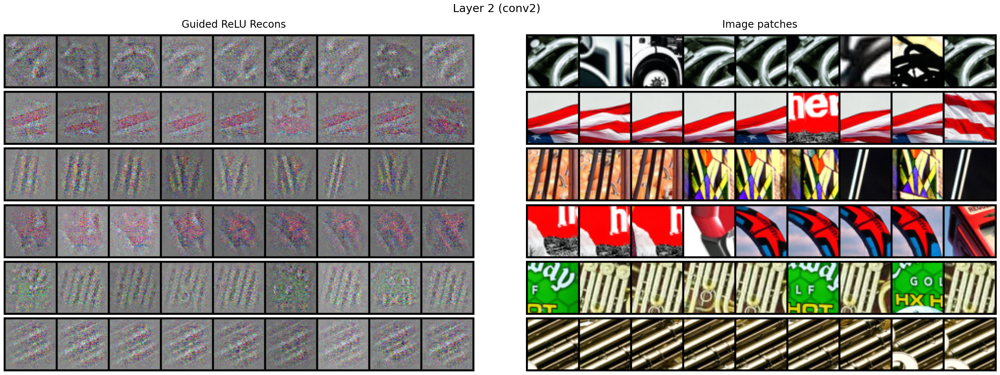

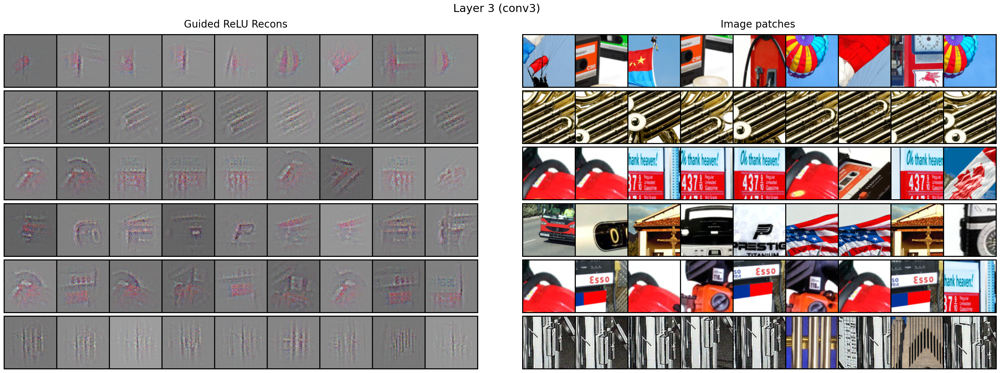

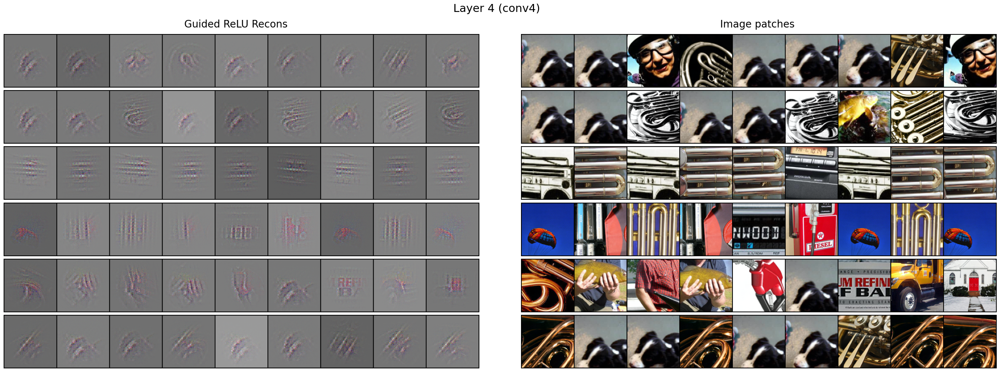

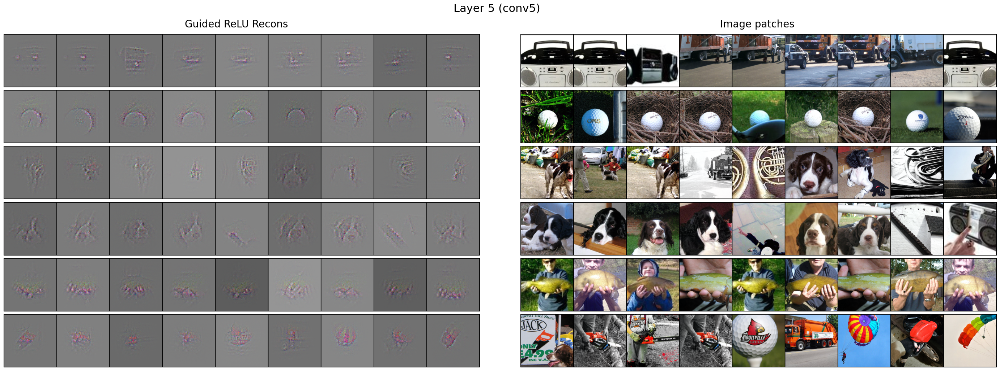

In [ ]:
vis = Visualiser(model, device=device, mean_image_224=mean_image)

panels = vis.figure2_panel(
    test_loader,
    layers=("conv2","conv3","conv4","conv5"),
    k_per_map=9,
    n_maps=6,
    seed=0,
    save_guided=False,
    out_dir="./vis_topacts"
)
vis.show_panels(panels)
vis.close()